$$
\newcommand{\mat}[1]{\boldsymbol {#1}}
\newcommand{\mattr}[1]{\boldsymbol {#1}^\top}
\newcommand{\matinv}[1]{\boldsymbol {#1}^{-1}}
\newcommand{\vec}[1]{\boldsymbol {#1}}
\newcommand{\vectr}[1]{\boldsymbol {#1}^\top}
\newcommand{\rvar}[1]{\mathrm {#1}}
\newcommand{\rvec}[1]{\boldsymbol{\mathrm{#1}}}
\newcommand{\diag}{\mathop{\mathrm {diag}}}
\newcommand{\set}[1]{\mathbb {#1}}
\newcommand{\cset}[1]{\mathcal{#1}}
\newcommand{\norm}[1]{\left\lVert#1\right\rVert}
\newcommand{\pderiv}[2]{\frac{\partial #1}{\partial #2}}
\newcommand{\bb}[1]{\boldsymbol{#1}}
\newcommand{\E}[2][]{\mathbb{E}_{#1}\left[#2\right]}
\newcommand{\ip}[3]{\left<#1,#2\right>_{#3}}
\newcommand{\given}[]{\,\middle\vert\,}
\newcommand{\DKL}[2]{\cset{D}_{\text{KL}}\left(#1\,\Vert\, #2\right)}
\newcommand{\grad}[]{\nabla}
$$

# Part 3: Mini-Project
<a id=part3></a>

In this part you'll implement a small comparative-analysis project, heavily based on the materials from the tutorials and homework.

You must **choose one** of the project options specified below.

### Guidelines

- You should implement the code which displays your results in this notebook, and add any additional code files for your implementation in the `project/` directory. You can import these files here, as we do for the homeworks.
- Running this notebook should not perform any training - load your results from some output files and display them here. The notebook must be runnable from start to end without errors.
- You must include a detailed write-up (in the notebook) of what you implemented and how. 
- Explain the structure of your code and how to run it to reproduce your results.
- Explicitly state any external code you used, including built-in pytorch models and code from the course tutorials/homework.
- Analyze your numerical results, explaining **why** you got these results (not just specifying the results).
- Where relevant, place all results in a table or display them using a graph.
- Before submitting, make sure all files which are required to run this notebook are included in the generated submission zip.
- Try to keep the submission file size under 10MB. Do not include model checkpoint files, dataset files, or any other non-essentials files. Instead include your results as images/text files/pickles/etc, and load them for display in this notebook. 

## Sentiment Analysis with Self-Attention and Word Embeddings

Based on Tutorials 6 and 7, we'll implement and train an improved sentiment analysis model.
We'll use self-attention instead of RNNs and incorporate pre-trained word embeddings.

In tutorial 6 we saw that we can train word embeddings together with the model.
Although this produces embeddings which are customized to the specific task at hand,
it also greatly increases training time.
A common technique is to use pre-trained word embeddings.
This is essentially a large mapping from words (e.g. in english) to some
high-dimensional vector, such that semantically similar words have an embedding that is
"close" by some metric (e.g. cosine distance).
Use the [GloVe](https://nlp.stanford.edu/projects/glove/) 6B embeddings for this purpose.
You can load these vectors into the weights of an `nn.Embedding` layer.

In tutorial 7 we learned how attention can be used to learn to predict a relative importance
for each element in a sequence, compared to the other elements.
Here, we'll replace the RNN with self-attention only approach similar to Transformer models, roughly based on [this paper](https://www.aclweb.org/anthology/W18-6219.pdf).
After embedding each word in the sentence using the pre-trained word-embedding a positional-encoding vector is added to provide each word in the sentence a unique value based on it's location.
One or more self-attention layers are then applied to the results, to obtain an importance weighting for each word.
Then we classify the sentence based on the average these weighted encodings.


Now, using these approaches, you need to:

- Implement a **baseline** model: Use pre-trained embeddings with an RNN-based model.
You can use LSTM/GRU or bi-directional versions of these, in a way very similar to what we implemented in the tutorial.
-  Implement an **improved** model: Based on the self-attention approach, implement an attention-based sentiment analysis model that has 1-2 self-attention layers instead of an RNN. You should use the same pre-trained word embeddings for this model.
- You can use pytorch's built-in RNNs, attention layers, etc.
- For positional encoding you can use the sinosoidal approach described in the paper (first proposed [here](https://arxiv.org/pdf/1706.03762.pdf)). You can use existing online implementations (even though it's straightforward to implement). 
- You can use the SST database as shown in the tutorial.

Your results should include:
- Everything written in the **Guidelines** above.
- A comparative analysis: compare the baseline to the improved model. Compare in terms of overall classification accuracy and show a multiclass confusion matrix.
- Visualize of the attention maps for a few movie reviews from each class, and explain the results.

## Spectrally-Normalized Wasserstein GANs

In HW3 we implemented a simple GANs from scratch, using an approach very similar to the original GAN paper. However, the results left much to be desired and we discovered first-hand how hard it is to train GANs due to their inherent instability.

One of the prevailing approaches for improving training stability for GANs is to use a technique called [Spectral Normalization](https://arxiv.org/pdf/1802.05957.pdf) to normalize the largest singular value of a weight matrix so that it equals 1.
This approach is generally applied to the discriminator's weights in order to stabilize training. The resulting model is sometimes referred to as a SN-GAN.
See Appendix A in the linked paper for the exact algorithm. You can also use pytorch's `spectral_norm`.

Another very common improvement to the vanilla GAN is known a [Wasserstein GAN](https://arxiv.org/pdf/1701.07875.pdf) (WGAN). It uses a simple modification to the loss function, with strong theoretical justifications based on the Wasserstein (earth-mover's) distance.
See also [here](https://developers.google.com/machine-learning/gan/loss) for a brief explanation of this loss function.

One problem with generative models for images is that it's difficult to objectively assess the quality of the resulting images.
To also obtain a quantitative score for the images generated by each model,
we'll use the [Inception Score](https://arxiv.org/pdf/1606.03498.pdf).
This uses a pre-trained Inception CNN model on the generated images and computes a score based on the predicted probability for each class.
Although not a perfect proxy for subjective quality, it's commonly used a way to compare generative models.
You can use an implementation of this score that you find online, e.g. [this one](https://github.com/sbarratt/inception-score-pytorch) or implement it yourself.

Based on the linked papers, add Spectral Normalization and the Wassertein loss to your GAN from HW3.
Compare between:
- The baseline model (vanilla GAN)
- SN-GAN (vanilla + Spectral Normalization)
- WGAN (using Wasserstein Loss)
- Optional: SN+WGAN, i.e. a combined model using both modifications.

As a dataset, you can use [LFW](http://vis-www.cs.umass.edu/lfw/) as in HW3 or [CelebA](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html), or even choose a custom dataset (note that there's a dataloder for CelebA in `torchvision`). 

Your results should include:
- Everything written in the **Guidelines** above.
- A comparative analysis between the baseline and the other models. Compare:
  - Subjective quality (show multiple generated images from each model)
  - Inception score (can use a subset of the data).
- You should show substantially improved subjective visual results with these techniques.

## Implementation

**TODO**: This is where you should write your explanations and implement the code to display the results.
See guidelines about what to include in this section.

In [1]:
import unittest
import os
import sys
import pathlib
import urllib
import shutil
import re
import zipfile

import numpy as np
import torch
import matplotlib.pyplot as plt

%load_ext autoreload
%autoreload 2

test = unittest.TestCase()
plt.rcParams.update({'font.size': 12})
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)

Using device: cuda


In [ ]:
import cs236781.plot as plot
import cs236781.download

DATA_DIR = pathlib.Path.home().joinpath('.pytorch-datasets')
DATA_URL = 'http://vis-www.cs.umass.edu/lfw/lfw-bush.zip'

_, dataset_dir = cs236781.download.download_data(out_path=DATA_DIR, url=DATA_URL, extract=True, force=False)

In [ ]:
import torchvision.transforms as T
from torchvision.datasets import ImageFolder

im_size = 64
tf = T.Compose([
    # Resize to constant spatial dimensions
    T.Resize((im_size, im_size)),
    # PIL.Image -> torch.Tensor
    T.ToTensor(),
    # Dynamic range [0,1] -> [-1, 1]
    T.Normalize(mean=(.5,.5,.5), std=(.5,.5,.5)),
])

ds_gwb = ImageFolder(os.path.dirname(dataset_dir), tf)

In [ ]:
import torch.optim as optim
from torch.utils.data import DataLoader
from project.hyperparams import gan_hyperparams
from project import gan
torch.manual_seed(42)

# Hyperparams
hp = gan_hyperparams()
batch_size = hp['batch_size']
z_dim = hp['z_dim']

# Data
dl_train = DataLoader(ds_gwb, batch_size, shuffle=True)
im_size = ds_gwb[0][0].shape

# Model
dsc = gan.SNDiscriminator(im_size).to(device)
gen = gan.Generator(z_dim, featuremap_size=4).to(device)

# Optimizer
def create_optimizer(model_params, opt_params):
    opt_params = opt_params.copy()
    optimizer_type = opt_params['type']
    opt_params.pop('type')
    return optim.__dict__[optimizer_type](model_params, **opt_params)
dsc_optimizer = create_optimizer(dsc.parameters(), hp['discriminator_optimizer'])
gen_optimizer = create_optimizer(gen.parameters(), hp['generator_optimizer'])

# Loss
def dsc_loss_fn(y_data, y_generated):
    return optim.discriminator_loss_fn(y_data, y_generated, hp['data_label'], hp['label_noise'])

def gen_loss_fn(y_generated):
    return gan.generator_loss_fn(y_generated, hp['data_label'])

# Training
checkpoint_file = 'checkpoints/gan'
checkpoint_file_final = f'{checkpoint_file}_final'
if os.path.isfile(f'{checkpoint_file}.pt'):
    os.remove(f'{checkpoint_file}.pt')

# Show hypers
print(hp)

In [ ]:
import IPython.display
import tqdm
from project.gan import train_batch, save_checkpoint

num_epochs = 100

if os.path.isfile(f'{checkpoint_file_final}.pt'):
    print(f'*** Loading final checkpoint file {checkpoint_file_final} instead of training')
    num_epochs = 0
    gen = torch.load(f'{checkpoint_file_final}.pt', map_location=device)
    checkpoint_file = checkpoint_file_final

try:
    dsc_avg_losses, gen_avg_losses = [], []
    for epoch_idx in range(num_epochs):
        # We'll accumulate batch losses and show an average once per epoch.
        dsc_losses, gen_losses = [], []
        print(f'--- EPOCH {epoch_idx+1}/{num_epochs} ---')

        with tqdm.tqdm(total=len(dl_train.batch_sampler), file=sys.stdout) as pbar:
            for batch_idx, (x_data, _) in enumerate(dl_train):
                x_data = x_data.to(device)
                dsc_loss, gen_loss = train_batch(
                    dsc, gen,
                    dsc_loss_fn, gen_loss_fn,
                    dsc_optimizer, gen_optimizer,
                    x_data)
                dsc_losses.append(dsc_loss)
                gen_losses.append(gen_loss)
                pbar.update()

        dsc_avg_losses.append(np.mean(dsc_losses))
        gen_avg_losses.append(np.mean(gen_losses))
        print(f'Discriminator loss: {dsc_avg_losses[-1]}')
        print(f'Generator loss:     {gen_avg_losses[-1]}')
        
        if save_checkpoint(gen, dsc_avg_losses, gen_avg_losses, checkpoint_file):
            print(f'Saved checkpoint.')
            

        samples = gen.sample(5, with_grad=False)
        fig, _ = plot.tensors_as_images(samples.cpu(), figsize=(6,2))
        IPython.display.display(fig)
        plt.close(fig)
except KeyboardInterrupt as e:
    print('\n *** Training interrupted by user')

In [ ]:
print(dsc, gen)

File /home/ofir.s/.pytorch-datasets/lfw-bush.zip exists, skipping download.
Extracting /home/ofir.s/.pytorch-datasets/lfw-bush.zip...
Extracted 531 to /home/ofir.s/.pytorch-datasets/lfw/George_W_Bush
--- EPOCH 1/100 ---
100%|██████████| 10/10 [00:01<00:00,  5.42it/s]
Discriminator loss: 0.4050607368350029
Generator loss:     4.897042155265808
Saved checkpoint.


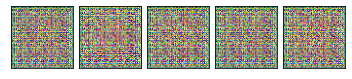

--- EPOCH 2/100 ---
100%|██████████| 10/10 [00:01<00:00,  5.42it/s]
Discriminator loss: 0.07471526209264993
Generator loss:     8.272890996932983
Saved checkpoint.


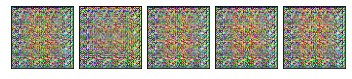

--- EPOCH 3/100 ---
100%|██████████| 10/10 [00:01<00:00,  5.40it/s]
Discriminator loss: 0.1367883293889463
Generator loss:     12.885612964630127
Saved checkpoint.


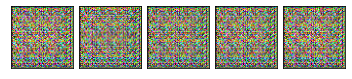

--- EPOCH 4/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.29it/s]
Discriminator loss: 0.08540296982973813
Generator loss:     13.894982051849365
Saved checkpoint.


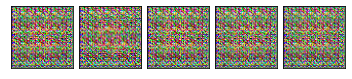

--- EPOCH 5/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.16it/s]
Discriminator loss: 0.24181948285549879
Generator loss:     13.669427394866943
Saved checkpoint.


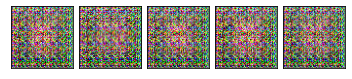

--- EPOCH 6/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.39it/s]
Discriminator loss: 0.37208703309297564
Generator loss:     14.934593963623048
Saved checkpoint.


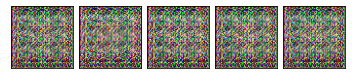

--- EPOCH 7/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.35it/s]
Discriminator loss: 0.3294762236997485
Generator loss:     12.109280633926392
Saved checkpoint.


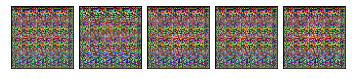

--- EPOCH 8/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.30it/s]
Discriminator loss: 0.22460875064134597
Generator loss:     9.966163492202758
Saved checkpoint.


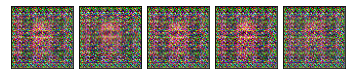

--- EPOCH 9/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.09it/s]
Discriminator loss: 0.4070071458816528
Generator loss:     12.555715370178223
Saved checkpoint.


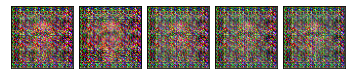

--- EPOCH 10/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.29it/s]
Discriminator loss: 0.48655902612954377
Generator loss:     10.519023656845093
Saved checkpoint.


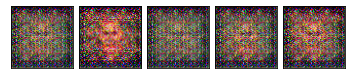

--- EPOCH 11/100 ---
100%|██████████| 10/10 [00:01<00:00,  5.50it/s]
Discriminator loss: 0.8651859015226364
Generator loss:     9.39245834350586
Saved checkpoint.


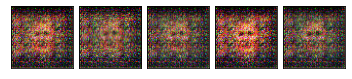

--- EPOCH 12/100 ---
100%|██████████| 10/10 [00:01<00:00,  5.33it/s]
Discriminator loss: 0.5038953438401222
Generator loss:     7.101568007469178
Saved checkpoint.


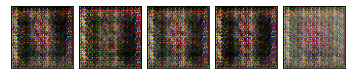

--- EPOCH 13/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.22it/s]
Discriminator loss: 0.4214023470878601
Generator loss:     5.626567077636719
Saved checkpoint.


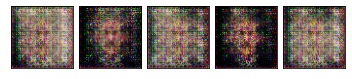

--- EPOCH 14/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.42it/s]
Discriminator loss: 0.9402059018611908
Generator loss:     5.458721566200256
Saved checkpoint.


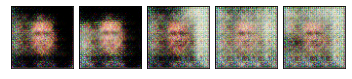

--- EPOCH 15/100 ---
100%|██████████| 10/10 [00:01<00:00,  5.94it/s]
Discriminator loss: 1.3584767311811448
Generator loss:     3.365519195795059
Saved checkpoint.


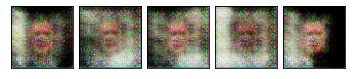

--- EPOCH 16/100 ---
100%|██████████| 10/10 [00:01<00:00,  5.40it/s]
Discriminator loss: 0.7886773347854614
Generator loss:     2.79783239364624
Saved checkpoint.


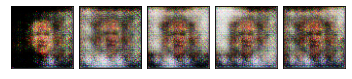

--- EPOCH 17/100 ---
100%|██████████| 10/10 [00:01<00:00,  5.43it/s]
Discriminator loss: 0.8141200542449951
Generator loss:     3.07515435218811
Saved checkpoint.


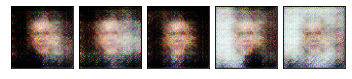

--- EPOCH 18/100 ---
100%|██████████| 10/10 [00:01<00:00,  5.39it/s]
Discriminator loss: 0.7213282704353332
Generator loss:     3.184585928916931
Saved checkpoint.


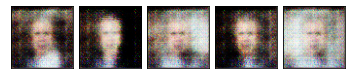

--- EPOCH 19/100 ---
100%|██████████| 10/10 [00:01<00:00,  5.42it/s]
Discriminator loss: 0.6727861404418946
Generator loss:     3.883818173408508
Saved checkpoint.


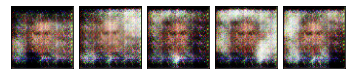

--- EPOCH 20/100 ---
100%|██████████| 10/10 [00:01<00:00,  5.34it/s]
Discriminator loss: 0.689233236014843
Generator loss:     4.590413308143615
Saved checkpoint.


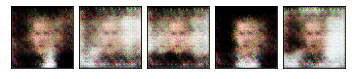

--- EPOCH 21/100 ---
100%|██████████| 10/10 [00:01<00:00,  5.22it/s]
Discriminator loss: 0.7132295072078705
Generator loss:     3.895945692062378
Saved checkpoint.


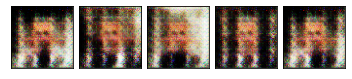

--- EPOCH 22/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.38it/s]
Discriminator loss: 0.8719483405351639
Generator loss:     4.941091799736023
Saved checkpoint.


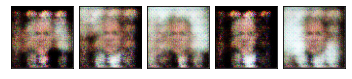

--- EPOCH 23/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.24it/s]
Discriminator loss: 0.580884900689125
Generator loss:     4.791546034812927
Saved checkpoint.


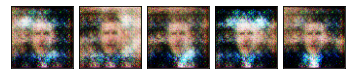

--- EPOCH 24/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.33it/s]
Discriminator loss: 0.5372024267911911
Generator loss:     5.099560403823853
Saved checkpoint.


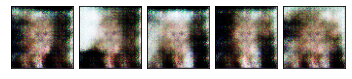

--- EPOCH 25/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.22it/s]
Discriminator loss: 0.7179417014122009
Generator loss:     4.612471282482147
Saved checkpoint.


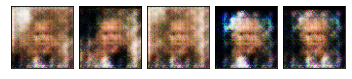

--- EPOCH 26/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.22it/s]
Discriminator loss: 0.8795893132686615
Generator loss:     4.792791771888733
Saved checkpoint.


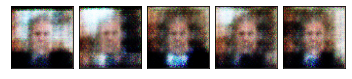

--- EPOCH 27/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.32it/s]
Discriminator loss: 0.6335150003433228
Generator loss:     4.6249735116958615
Saved checkpoint.


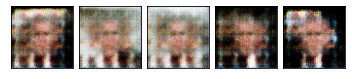

--- EPOCH 28/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.29it/s]
Discriminator loss: 0.9541424721479416
Generator loss:     4.904829597473144
Saved checkpoint.


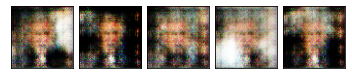

--- EPOCH 29/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.15it/s]
Discriminator loss: 0.5701491057872772
Generator loss:     4.12123486995697
Saved checkpoint.


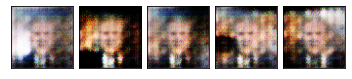

--- EPOCH 30/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.36it/s]
Discriminator loss: 0.9753089904785156
Generator loss:     4.666465556621551
Saved checkpoint.


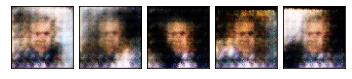

--- EPOCH 31/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.03it/s]
Discriminator loss: 0.5674870729446411
Generator loss:     3.8095584392547606
Saved checkpoint.


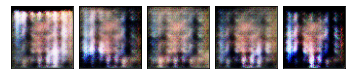

--- EPOCH 32/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.33it/s]
Discriminator loss: 0.46041041761636736
Generator loss:     5.050773310661316
Saved checkpoint.


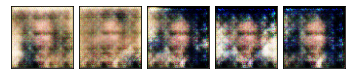

--- EPOCH 33/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.38it/s]
Discriminator loss: 0.6016458787024022
Generator loss:     4.5669265508651735
Saved checkpoint.


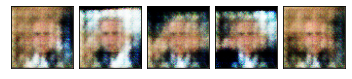

--- EPOCH 34/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.31it/s]
Discriminator loss: 0.7420748472213745
Generator loss:     4.501323962211609
Saved checkpoint.


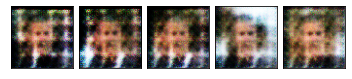

--- EPOCH 35/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.30it/s]
Discriminator loss: 0.6695972472429276
Generator loss:     5.155953311920166
Saved checkpoint.


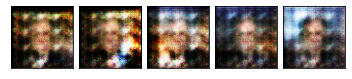

--- EPOCH 36/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.27it/s]
Discriminator loss: 0.8706057101488114
Generator loss:     4.449583613872528
Saved checkpoint.


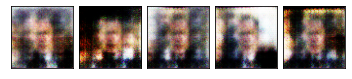

--- EPOCH 37/100 ---
100%|██████████| 10/10 [00:01<00:00,  5.94it/s]
Discriminator loss: 0.5354087024927139
Generator loss:     3.5618846654891967
Saved checkpoint.


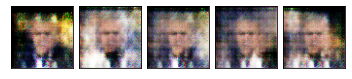

--- EPOCH 38/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.13it/s]
Discriminator loss: 0.5851069569587708
Generator loss:     4.265813589096069
Saved checkpoint.


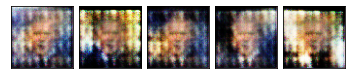

--- EPOCH 39/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.21it/s]
Discriminator loss: 0.6937211275100708
Generator loss:     3.994750809669495
Saved checkpoint.


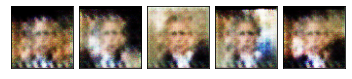

--- EPOCH 40/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.30it/s]
Discriminator loss: 0.7104054421186448
Generator loss:     4.065015995502472
Saved checkpoint.


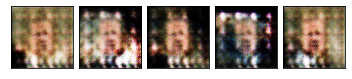

--- EPOCH 41/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.39it/s]
Discriminator loss: 0.7230803012847901
Generator loss:     3.741734743118286
Saved checkpoint.


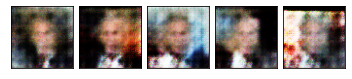

--- EPOCH 42/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.33it/s]
Discriminator loss: 0.5658580839633942
Generator loss:     3.393776202201843
Saved checkpoint.


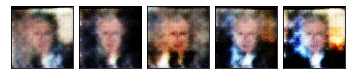

--- EPOCH 43/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.33it/s]
Discriminator loss: 0.6620408236980438
Generator loss:     3.591045594215393
Saved checkpoint.


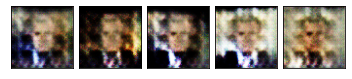

--- EPOCH 44/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.16it/s]
Discriminator loss: 0.6092357099056244
Generator loss:     4.3675058603286745
Saved checkpoint.


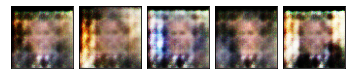

--- EPOCH 45/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.31it/s]
Discriminator loss: 0.4691135883331299
Generator loss:     3.6678804636001585
Saved checkpoint.


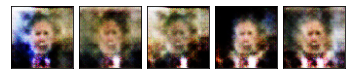

--- EPOCH 46/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.25it/s]
Discriminator loss: 0.6247615709900856
Generator loss:     4.659201598167419
Saved checkpoint.


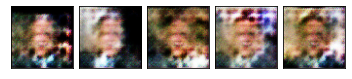

--- EPOCH 47/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.09it/s]
Discriminator loss: 0.5210167080163955
Generator loss:     4.1521596074104306
Saved checkpoint.


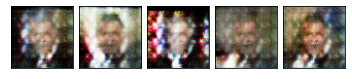

--- EPOCH 48/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.25it/s]
Discriminator loss: 0.8269573509693146
Generator loss:     4.404212951660156
Saved checkpoint.


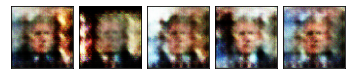

--- EPOCH 49/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.43it/s]
Discriminator loss: 0.7912367165088654
Generator loss:     4.305519950389862
Saved checkpoint.


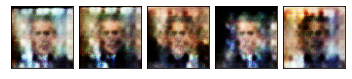

--- EPOCH 50/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.36it/s]
Discriminator loss: 0.6080647587776185
Generator loss:     4.178904795646668
Saved checkpoint.


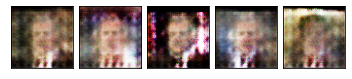

--- EPOCH 51/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.29it/s]
Discriminator loss: 0.5157416999340058
Generator loss:     4.155583000183105
Saved checkpoint.


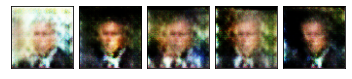

--- EPOCH 52/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.32it/s]
Discriminator loss: 0.656511253118515
Generator loss:     4.305530059337616
Saved checkpoint.


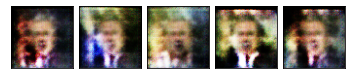

--- EPOCH 53/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.39it/s]
Discriminator loss: 0.5722081214189529
Generator loss:     4.147667384147644
Saved checkpoint.


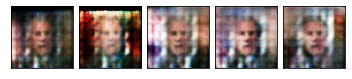

--- EPOCH 54/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.37it/s]
Discriminator loss: 0.6645123928785324
Generator loss:     4.326544904708863
Saved checkpoint.


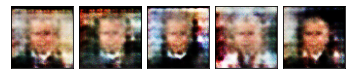

--- EPOCH 55/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.12it/s]
Discriminator loss: 0.782297894358635
Generator loss:     4.69311294555664
Saved checkpoint.


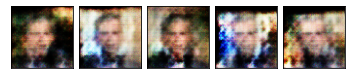

--- EPOCH 56/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.34it/s]
Discriminator loss: 0.5871873050928116
Generator loss:     3.899346446990967
Saved checkpoint.


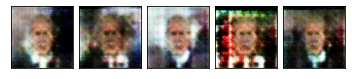

--- EPOCH 57/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.23it/s]
Discriminator loss: 0.6647538185119629
Generator loss:     4.232052564620972
Saved checkpoint.


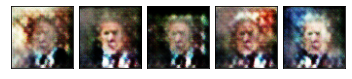

--- EPOCH 58/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.38it/s]
Discriminator loss: 0.6374302238225937
Generator loss:     4.562110447883606
Saved checkpoint.


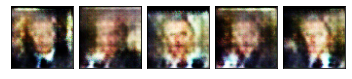

--- EPOCH 59/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.36it/s]
Discriminator loss: 0.510328397154808
Generator loss:     3.700106978416443
Saved checkpoint.


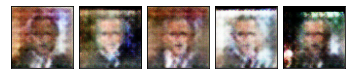

--- EPOCH 60/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.22it/s]
Discriminator loss: 0.46184458434581754
Generator loss:     3.956023073196411
Saved checkpoint.


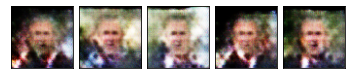

--- EPOCH 61/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.21it/s]
Discriminator loss: 0.5591155260801315
Generator loss:     4.281586444377899
Saved checkpoint.


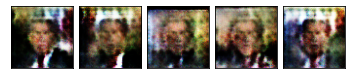

--- EPOCH 62/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.27it/s]
Discriminator loss: 0.5606080532073975
Generator loss:     4.649932193756103
Saved checkpoint.


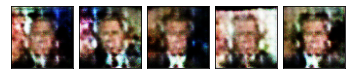

--- EPOCH 63/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.22it/s]
Discriminator loss: 0.5120751768350601
Generator loss:     4.5973978519439695
Saved checkpoint.


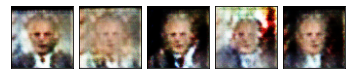

--- EPOCH 64/100 ---
100%|██████████| 10/10 [00:01<00:00,  5.39it/s]
Discriminator loss: 0.7873531728982925
Generator loss:     4.502810764312744
Saved checkpoint.


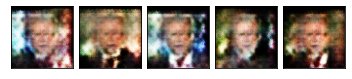

--- EPOCH 65/100 ---
100%|██████████| 10/10 [00:01<00:00,  5.27it/s]
Discriminator loss: 0.5100691437721252
Generator loss:     4.021987962722778
Saved checkpoint.


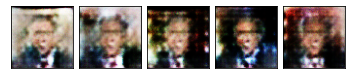

--- EPOCH 66/100 ---
100%|██████████| 10/10 [00:01<00:00,  5.41it/s]
Discriminator loss: 0.4837196856737137
Generator loss:     4.071634578704834
Saved checkpoint.


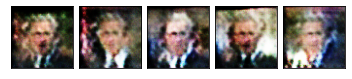

--- EPOCH 67/100 ---
100%|██████████| 10/10 [00:01<00:00,  5.35it/s]
Discriminator loss: 0.45756483972072604
Generator loss:     4.088301944732666
Saved checkpoint.


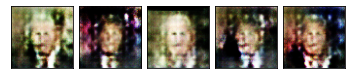

--- EPOCH 68/100 ---
100%|██████████| 10/10 [00:01<00:00,  5.24it/s]
Discriminator loss: 0.5382857188582421
Generator loss:     4.314244174957276
Saved checkpoint.


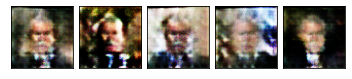

--- EPOCH 69/100 ---
100%|██████████| 10/10 [00:01<00:00,  5.42it/s]
Discriminator loss: 0.6290914237499237
Generator loss:     4.524961221218109
Saved checkpoint.


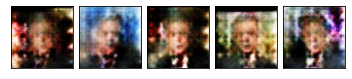

--- EPOCH 70/100 ---
100%|██████████| 10/10 [00:01<00:00,  5.28it/s]
Discriminator loss: 0.7124243885278702
Generator loss:     4.494610095024109
Saved checkpoint.


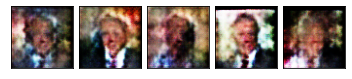

--- EPOCH 71/100 ---
100%|██████████| 10/10 [00:01<00:00,  5.03it/s]
Discriminator loss: 0.7151109546422958
Generator loss:     4.6656277775764465
Saved checkpoint.


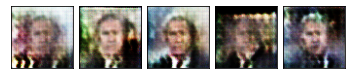

--- EPOCH 72/100 ---
100%|██████████| 10/10 [00:01<00:00,  5.56it/s]
Discriminator loss: 0.4692849487066269
Generator loss:     3.9062572479248048
Saved checkpoint.


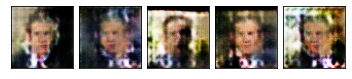

--- EPOCH 73/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.32it/s]
Discriminator loss: 0.4449525237083435
Generator loss:     4.1206093549728395
Saved checkpoint.


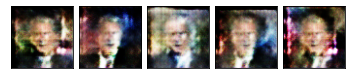

--- EPOCH 74/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.25it/s]
Discriminator loss: 0.5217384427785874
Generator loss:     4.419156455993653
Saved checkpoint.


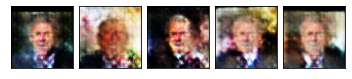

--- EPOCH 75/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.17it/s]
Discriminator loss: 0.4841250091791153
Generator loss:     3.819908046722412
Saved checkpoint.


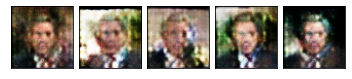

--- EPOCH 76/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.19it/s]
Discriminator loss: 0.5767500758171081
Generator loss:     4.799359512329102
Saved checkpoint.


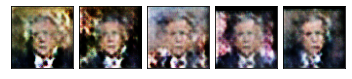

--- EPOCH 77/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.25it/s]
Discriminator loss: 0.508574216067791
Generator loss:     4.773336052894592
Saved checkpoint.


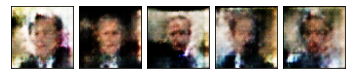

--- EPOCH 78/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.07it/s]
Discriminator loss: 0.6012185364961624
Generator loss:     4.718448722362519
Saved checkpoint.


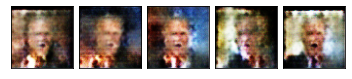

--- EPOCH 79/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.24it/s]
Discriminator loss: 0.6040380321443081
Generator loss:     4.256980466842651
Saved checkpoint.


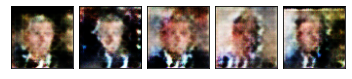

--- EPOCH 80/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.31it/s]
Discriminator loss: 0.45307849794626237
Generator loss:     4.101944613456726
Saved checkpoint.


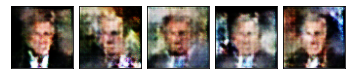

--- EPOCH 81/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.31it/s]
Discriminator loss: 0.3207238167524338
Generator loss:     3.7080814599990846
Saved checkpoint.


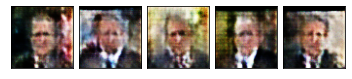

--- EPOCH 82/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.45it/s]
Discriminator loss: 0.581763219833374
Generator loss:     4.58195949792862
Saved checkpoint.


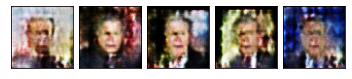

--- EPOCH 83/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.31it/s]
Discriminator loss: 0.8299876034259797
Generator loss:     4.470026957988739
Saved checkpoint.


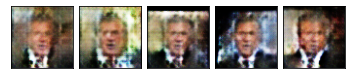

--- EPOCH 84/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.33it/s]
Discriminator loss: 0.3737312316894531
Generator loss:     3.912888598442078
Saved checkpoint.


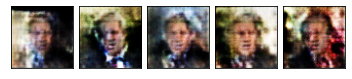

--- EPOCH 85/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.34it/s]
Discriminator loss: 0.47975645065307615
Generator loss:     3.879316878318787
Saved checkpoint.


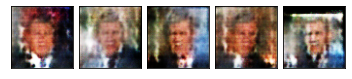

--- EPOCH 86/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.42it/s]
Discriminator loss: 0.46427796632051466
Generator loss:     4.505609035491943
Saved checkpoint.


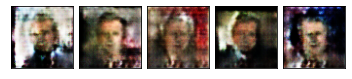

--- EPOCH 87/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.04it/s]
Discriminator loss: 0.3472019821405411
Generator loss:     4.224636793136597
Saved checkpoint.


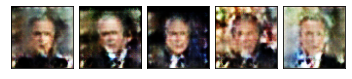

--- EPOCH 88/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.18it/s]
Discriminator loss: 0.7921273067593575
Generator loss:     4.439135181903839
Saved checkpoint.


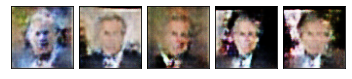

--- EPOCH 89/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.36it/s]
Discriminator loss: 0.5140207231044769
Generator loss:     3.9486252784729006
Saved checkpoint.


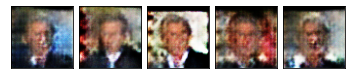

--- EPOCH 90/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.37it/s]
Discriminator loss: 0.6505244374275208
Generator loss:     4.491302156448365
Saved checkpoint.


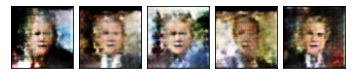

--- EPOCH 91/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.39it/s]
Discriminator loss: 0.4736313968896866
Generator loss:     4.497280263900757
Saved checkpoint.


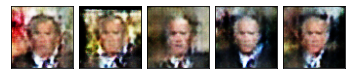

--- EPOCH 92/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.39it/s]
Discriminator loss: 0.4065500095486641
Generator loss:     4.222914433479309
Saved checkpoint.


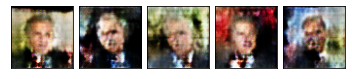

--- EPOCH 93/100 ---
100%|██████████| 10/10 [00:01<00:00,  5.93it/s]
Discriminator loss: 0.38434326499700544
Generator loss:     3.9125656843185426
Saved checkpoint.


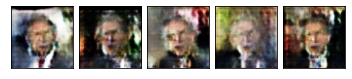

--- EPOCH 94/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.31it/s]
Discriminator loss: 0.3171084478497505
Generator loss:     3.883305025100708
Saved checkpoint.


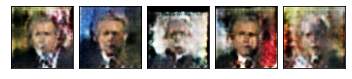

--- EPOCH 95/100 ---
100%|██████████| 10/10 [00:01<00:00,  5.98it/s]
Discriminator loss: 0.4964956670999527
Generator loss:     4.75353296995163
Saved checkpoint.


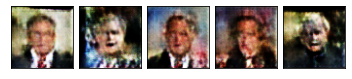

--- EPOCH 96/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.37it/s]
Discriminator loss: 0.7033401250839233
Generator loss:     4.15399831533432
Saved checkpoint.


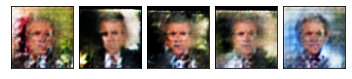

--- EPOCH 97/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.34it/s]
Discriminator loss: 0.4258728057146072
Generator loss:     4.008368992805481
Saved checkpoint.


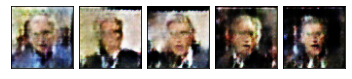

--- EPOCH 98/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.27it/s]
Discriminator loss: 0.3054829850792885
Generator loss:     4.174823641777039
Saved checkpoint.


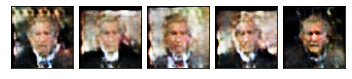

--- EPOCH 99/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.17it/s]
Discriminator loss: 0.30363262742757796
Generator loss:     4.317541933059692
Saved checkpoint.


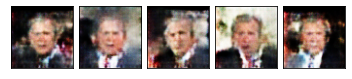

--- EPOCH 100/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.37it/s]
Discriminator loss: 0.5228071436285973
Generator loss:     5.073128259181976
Saved checkpoint.


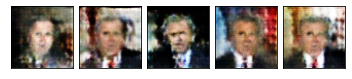

In [6]:
from project.hyperparams import gan_hyperparams
from project.train import *
hp = gan_hyperparams()
gan = GANTrainer(hp)
gan.train()

File /home/ofir.s/.pytorch-datasets/lfw-bush.zip exists, skipping download.
Extracting /home/ofir.s/.pytorch-datasets/lfw-bush.zip...
Extracted 531 to /home/ofir.s/.pytorch-datasets/lfw/George_W_Bush
--- EPOCH 1/100 ---
100%|██████████| 10/10 [00:01<00:00,  5.20it/s]
Discriminator loss: 0.32260993495583534
Generator loss:     8.368236446380616
Saved checkpoint.


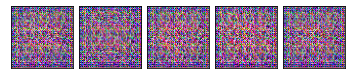

--- EPOCH 2/100 ---
100%|██████████| 10/10 [00:01<00:00,  5.25it/s]
Discriminator loss: 0.31600602697581054
Generator loss:     15.261901998519898
Saved checkpoint.


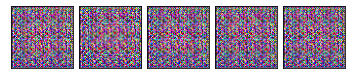

--- EPOCH 3/100 ---
100%|██████████| 10/10 [00:01<00:00,  5.25it/s]
Discriminator loss: 0.7815550599247217
Generator loss:     20.365970420837403
Saved checkpoint.


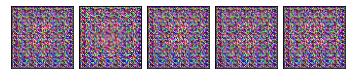

--- EPOCH 4/100 ---
100%|██████████| 10/10 [00:01<00:00,  5.94it/s]
Discriminator loss: 0.48467439860105516
Generator loss:     16.44571418762207
Saved checkpoint.


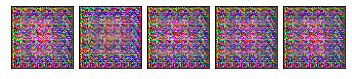

--- EPOCH 5/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.04it/s]
Discriminator loss: 0.9025572611019015
Generator loss:     17.334023332595827
Saved checkpoint.


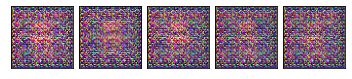

--- EPOCH 6/100 ---
100%|██████████| 10/10 [00:01<00:00,  5.97it/s]
Discriminator loss: 0.7529992274940014
Generator loss:     17.035878086090086
Saved checkpoint.


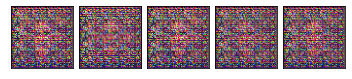

--- EPOCH 7/100 ---
100%|██████████| 10/10 [00:01<00:00,  5.67it/s]
Discriminator loss: 0.7433693831786513
Generator loss:     18.455317878723143
Saved checkpoint.


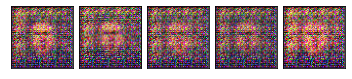

--- EPOCH 8/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.09it/s]
Discriminator loss: 1.0246418133378028
Generator loss:     16.084424638748168
Saved checkpoint.


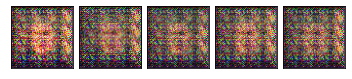

--- EPOCH 9/100 ---
100%|██████████| 10/10 [00:01<00:00,  5.72it/s]
Discriminator loss: 0.557011416554451
Generator loss:     11.944940900802612
Saved checkpoint.


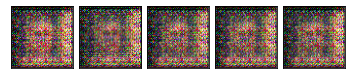

--- EPOCH 10/100 ---
100%|██████████| 10/10 [00:01<00:00,  5.82it/s]
Discriminator loss: 0.8272240847349167
Generator loss:     13.491203546524048
Saved checkpoint.


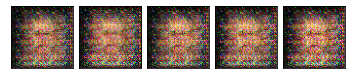

--- EPOCH 11/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.18it/s]
Discriminator loss: 1.6960885003209114
Generator loss:     12.881003379821777
Saved checkpoint.


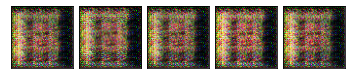

--- EPOCH 12/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.03it/s]
Discriminator loss: 0.6598236426711083
Generator loss:     9.13252363204956
Saved checkpoint.


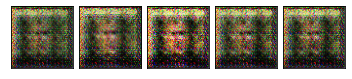

--- EPOCH 13/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.16it/s]
Discriminator loss: 0.34559025913476943
Generator loss:     7.809027624130249
Saved checkpoint.


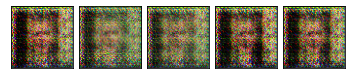

--- EPOCH 14/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.12it/s]
Discriminator loss: 0.5011510528624058
Generator loss:     9.665108156204223
Saved checkpoint.


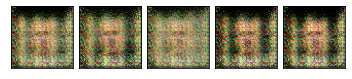

--- EPOCH 15/100 ---
100%|██████████| 10/10 [00:01<00:00,  5.78it/s]
Discriminator loss: 1.0012133851647378
Generator loss:     6.104794430732727
Saved checkpoint.


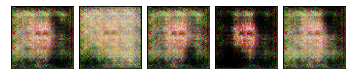

--- EPOCH 16/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.09it/s]
Discriminator loss: 0.8325028717517853
Generator loss:     3.636953091621399
Saved checkpoint.


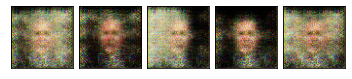

--- EPOCH 17/100 ---
100%|██████████| 10/10 [00:01<00:00,  5.87it/s]
Discriminator loss: 0.8531934052705765
Generator loss:     3.402534359693527
Saved checkpoint.


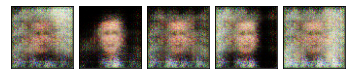

--- EPOCH 18/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.14it/s]
Discriminator loss: 0.6367921739816665
Generator loss:     2.990335214138031
Saved checkpoint.


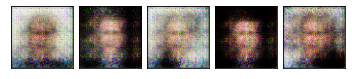

--- EPOCH 19/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.18it/s]
Discriminator loss: 0.9646588444709778
Generator loss:     3.606345510482788
Saved checkpoint.


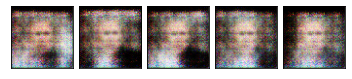

--- EPOCH 20/100 ---
100%|██████████| 10/10 [00:01<00:00,  5.88it/s]
Discriminator loss: 0.737574103474617
Generator loss:     3.3625280141830443
Saved checkpoint.


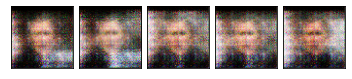

--- EPOCH 21/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.02it/s]
Discriminator loss: 0.5258276253938675
Generator loss:     3.4960262060165403
Saved checkpoint.


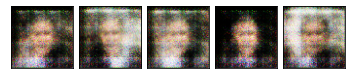

--- EPOCH 22/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.11it/s]
Discriminator loss: 0.7886302605271339
Generator loss:     4.0582030534744264
Saved checkpoint.


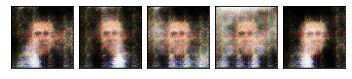

--- EPOCH 23/100 ---
100%|██████████| 10/10 [00:01<00:00,  5.98it/s]
Discriminator loss: 0.8278324872255325
Generator loss:     4.549991810321808
Saved checkpoint.


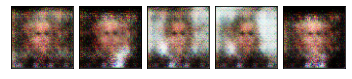

--- EPOCH 24/100 ---
100%|██████████| 10/10 [00:01<00:00,  5.99it/s]
Discriminator loss: 0.9310831665992737
Generator loss:     3.9215847730636595
Saved checkpoint.


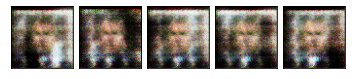

--- EPOCH 25/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.02it/s]
Discriminator loss: 0.5609781473875046
Generator loss:     3.752728509902954
Saved checkpoint.


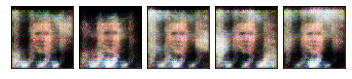

--- EPOCH 26/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.21it/s]
Discriminator loss: 0.67996287047863
Generator loss:     3.784521961212158
Saved checkpoint.


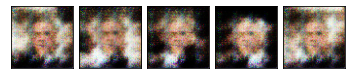

--- EPOCH 27/100 ---
100%|██████████| 10/10 [00:01<00:00,  5.99it/s]
Discriminator loss: 0.48397336602211
Generator loss:     4.105592107772827
Saved checkpoint.


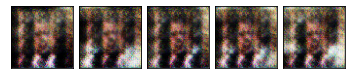

--- EPOCH 28/100 ---
100%|██████████| 10/10 [00:01<00:00,  5.99it/s]
Discriminator loss: 0.7435606509447098
Generator loss:     4.740350937843322
Saved checkpoint.


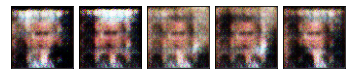

--- EPOCH 29/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.02it/s]
Discriminator loss: 0.5213327735662461
Generator loss:     4.287565660476685
Saved checkpoint.


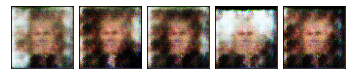

--- EPOCH 30/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.00it/s]
Discriminator loss: 0.7327344864606857
Generator loss:     4.206832134723664
Saved checkpoint.


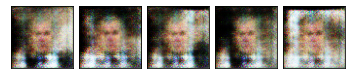

--- EPOCH 31/100 ---
100%|██████████| 10/10 [00:01<00:00,  5.85it/s]
Discriminator loss: 0.6457341909408569
Generator loss:     4.456971788406372
Saved checkpoint.


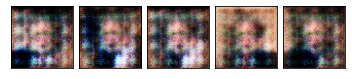

--- EPOCH 32/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.04it/s]
Discriminator loss: 0.7887961059808731
Generator loss:     4.399206137657165
Saved checkpoint.


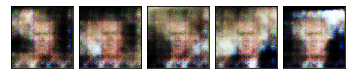

--- EPOCH 33/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.11it/s]
Discriminator loss: 0.7228363394737244
Generator loss:     4.246147680282593
Saved checkpoint.


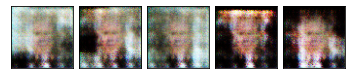

--- EPOCH 34/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.05it/s]
Discriminator loss: 0.5571986049413681
Generator loss:     4.164114594459534
Saved checkpoint.


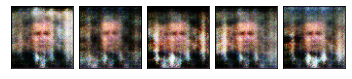

--- EPOCH 35/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.11it/s]
Discriminator loss: 0.7112383306026459
Generator loss:     5.111298775672912
Saved checkpoint.


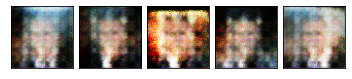

--- EPOCH 36/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.07it/s]
Discriminator loss: 0.7905295312404632
Generator loss:     4.935591030120849
Saved checkpoint.


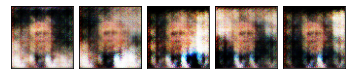

--- EPOCH 37/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.04it/s]
Discriminator loss: 0.6409183531999588
Generator loss:     4.215488481521606
Saved checkpoint.


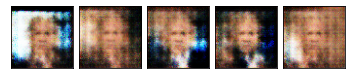

--- EPOCH 38/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.13it/s]
Discriminator loss: 0.5013886839151382
Generator loss:     3.926603150367737
Saved checkpoint.


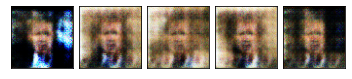

--- EPOCH 39/100 ---
100%|██████████| 10/10 [00:01<00:00,  5.73it/s]
Discriminator loss: 0.8043971717357635
Generator loss:     4.552496814727784
Saved checkpoint.


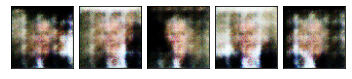

--- EPOCH 40/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.10it/s]
Discriminator loss: 0.7689758881926536
Generator loss:     4.549236297607422
Saved checkpoint.


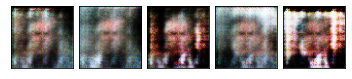

--- EPOCH 41/100 ---
100%|██████████| 10/10 [00:01<00:00,  5.80it/s]
Discriminator loss: 0.5764452964067459
Generator loss:     4.543219661712646
Saved checkpoint.


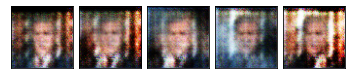

--- EPOCH 42/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.09it/s]
Discriminator loss: 0.6034754663705826
Generator loss:     3.981041121482849
Saved checkpoint.


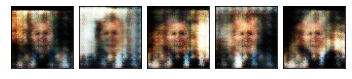

--- EPOCH 43/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.10it/s]
Discriminator loss: 0.6019606366753578
Generator loss:     3.9013280987739565
Saved checkpoint.


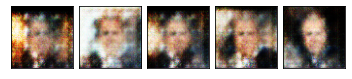

--- EPOCH 44/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.13it/s]
Discriminator loss: 0.4986664354801178
Generator loss:     3.7215355157852175
Saved checkpoint.


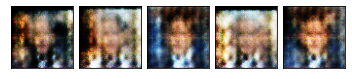

--- EPOCH 45/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.06it/s]
Discriminator loss: 0.63017598092556
Generator loss:     4.5598208665847775
Saved checkpoint.


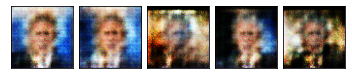

--- EPOCH 46/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.01it/s]
Discriminator loss: 0.45801099240779874
Generator loss:     4.190045166015625
Saved checkpoint.


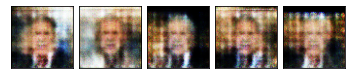

--- EPOCH 47/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.10it/s]
Discriminator loss: 0.5511330038309097
Generator loss:     4.349089360237121
Saved checkpoint.


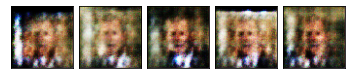

--- EPOCH 48/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.08it/s]
Discriminator loss: 0.5616961002349854
Generator loss:     4.582919287681579
Saved checkpoint.


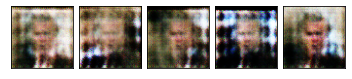

--- EPOCH 49/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.09it/s]
Discriminator loss: 0.5120537966489792
Generator loss:     4.597096180915832
Saved checkpoint.


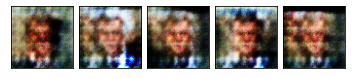

--- EPOCH 50/100 ---
100%|██████████| 10/10 [00:01<00:00,  5.89it/s]
Discriminator loss: 0.6434994041919708
Generator loss:     4.547800087928772
Saved checkpoint.


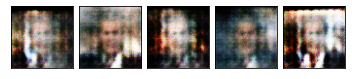

--- EPOCH 51/100 ---
100%|██████████| 10/10 [00:01<00:00,  5.93it/s]
Discriminator loss: 0.7043104588985443
Generator loss:     4.518706583976746
Saved checkpoint.


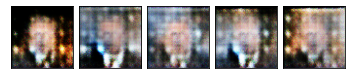

--- EPOCH 52/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.05it/s]
Discriminator loss: 0.5720046252012253
Generator loss:     4.155635595321655
Saved checkpoint.


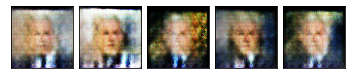

--- EPOCH 53/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.09it/s]
Discriminator loss: 0.6401637136936188
Generator loss:     4.716646480560303
Saved checkpoint.


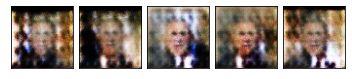

--- EPOCH 54/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.08it/s]
Discriminator loss: 0.9179269015789032
Generator loss:     4.685260689258575
Saved checkpoint.


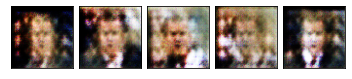

--- EPOCH 55/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.11it/s]
Discriminator loss: 0.6059836655855179
Generator loss:     4.041530132293701
Saved checkpoint.


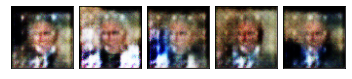

--- EPOCH 56/100 ---
100%|██████████| 10/10 [00:01<00:00,  5.72it/s]
Discriminator loss: 0.47628503739833833
Generator loss:     3.426990437507629
Saved checkpoint.


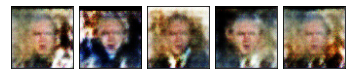

--- EPOCH 57/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.15it/s]
Discriminator loss: 0.4585739016532898
Generator loss:     3.856444787979126
Saved checkpoint.


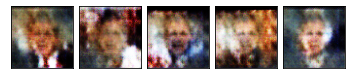

--- EPOCH 58/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.09it/s]
Discriminator loss: 0.6469758212566376
Generator loss:     4.0123594284057615
Saved checkpoint.


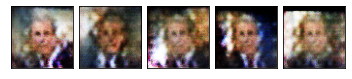

--- EPOCH 59/100 ---
100%|██████████| 10/10 [00:01<00:00,  5.92it/s]
Discriminator loss: 0.5028443217277527
Generator loss:     4.21734619140625
Saved checkpoint.


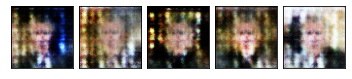

--- EPOCH 60/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.08it/s]
Discriminator loss: 0.7079880595207214
Generator loss:     4.318232941627502
Saved checkpoint.


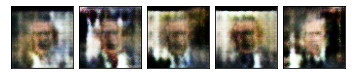

--- EPOCH 61/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.07it/s]
Discriminator loss: 0.452396459877491
Generator loss:     3.9307198524475098
Saved checkpoint.


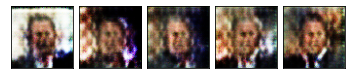

--- EPOCH 62/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.13it/s]
Discriminator loss: 0.5500914365053177
Generator loss:     4.458042705059052
Saved checkpoint.


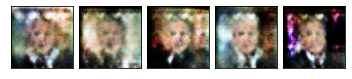

--- EPOCH 63/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.14it/s]
Discriminator loss: 0.36029167771339415
Generator loss:     3.9018826723098754
Saved checkpoint.


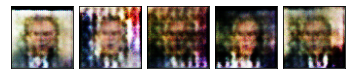

--- EPOCH 64/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.09it/s]
Discriminator loss: 0.6694124937057495
Generator loss:     4.641978216171265
Saved checkpoint.


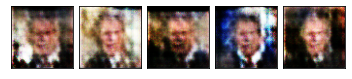

--- EPOCH 65/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.17it/s]
Discriminator loss: 0.40262867510318756
Generator loss:     3.9266513109207155
Saved checkpoint.


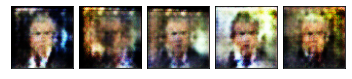

--- EPOCH 66/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.15it/s]
Discriminator loss: 0.6167359083890915
Generator loss:     4.881945729255676
Saved checkpoint.


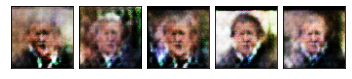

--- EPOCH 67/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.07it/s]
Discriminator loss: 0.5774769082665443
Generator loss:     4.351259326934814
Saved checkpoint.


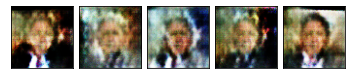

--- EPOCH 68/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.10it/s]
Discriminator loss: 0.54124536216259
Generator loss:     4.1924885511398315
Saved checkpoint.


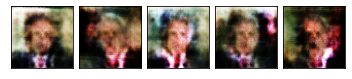

--- EPOCH 69/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.04it/s]
Discriminator loss: 0.518890668451786
Generator loss:     4.780649483203888
Saved checkpoint.


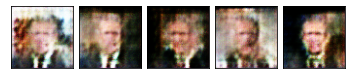

--- EPOCH 70/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.15it/s]
Discriminator loss: 0.5971568048000335
Generator loss:     3.9445661187171934
Saved checkpoint.


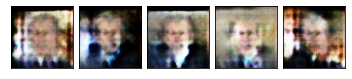

--- EPOCH 71/100 ---
100%|██████████| 10/10 [00:01<00:00,  5.84it/s]
Discriminator loss: 0.3985871225595474
Generator loss:     3.597201633453369
Saved checkpoint.


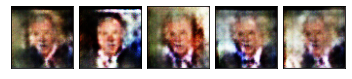

--- EPOCH 72/100 ---
100%|██████████| 10/10 [00:01<00:00,  5.85it/s]
Discriminator loss: 0.4752549767494202
Generator loss:     4.525077176094055
Saved checkpoint.


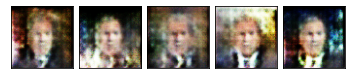

--- EPOCH 73/100 ---
100%|██████████| 10/10 [00:01<00:00,  5.80it/s]
Discriminator loss: 0.42967488467693327
Generator loss:     4.2658198595047
Saved checkpoint.


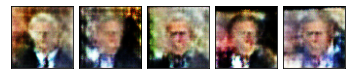

--- EPOCH 74/100 ---
100%|██████████| 10/10 [00:01<00:00,  5.76it/s]
Discriminator loss: 0.6232642307877541
Generator loss:     4.426991415023804
Saved checkpoint.


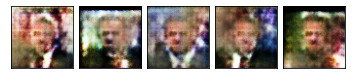

--- EPOCH 75/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.07it/s]
Discriminator loss: 0.5728750884532928
Generator loss:     4.546787798404694
Saved checkpoint.


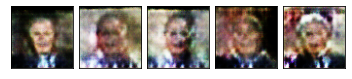

--- EPOCH 76/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.03it/s]
Discriminator loss: 0.5666122019290925
Generator loss:     4.22132441997528
Saved checkpoint.


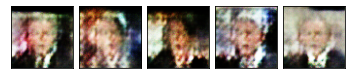

--- EPOCH 77/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.12it/s]
Discriminator loss: 0.4027398079633713
Generator loss:     4.2708406209945675
Saved checkpoint.


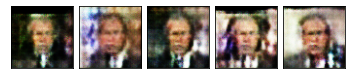

--- EPOCH 78/100 ---
100%|██████████| 10/10 [00:01<00:00,  5.96it/s]
Discriminator loss: 0.43283683955669405
Generator loss:     4.317261791229248
Saved checkpoint.


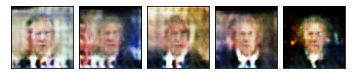

--- EPOCH 79/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.12it/s]
Discriminator loss: 0.6539962977170944
Generator loss:     4.4243361234664915
Saved checkpoint.


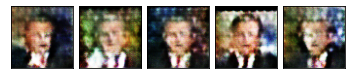

--- EPOCH 80/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.12it/s]
Discriminator loss: 0.476729816198349
Generator loss:     4.162967562675476
Saved checkpoint.


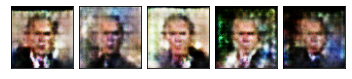

--- EPOCH 81/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.16it/s]
Discriminator loss: 0.4936209797859192
Generator loss:     4.463976001739502
Saved checkpoint.


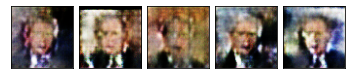

--- EPOCH 82/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.17it/s]
Discriminator loss: 0.4014188349246979
Generator loss:     4.025114727020264
Saved checkpoint.


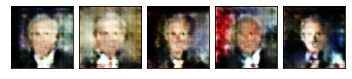

--- EPOCH 83/100 ---
100%|██████████| 10/10 [00:01<00:00,  5.80it/s]
Discriminator loss: 0.3454653427004814
Generator loss:     3.9293347597122192
Saved checkpoint.


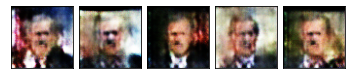

--- EPOCH 84/100 ---
100%|██████████| 10/10 [00:01<00:00,  5.94it/s]
Discriminator loss: 0.40315761864185334
Generator loss:     4.284331130981445
Saved checkpoint.


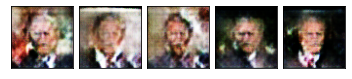

--- EPOCH 85/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.12it/s]
Discriminator loss: 0.7122752487659454
Generator loss:     5.029340028762817
Saved checkpoint.


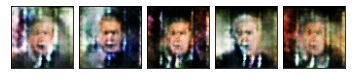

--- EPOCH 86/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.07it/s]
Discriminator loss: 0.6342922955751419
Generator loss:     4.484098720550537
Saved checkpoint.


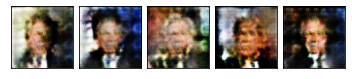

--- EPOCH 87/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.08it/s]
Discriminator loss: 0.46896110773086547
Generator loss:     3.913241243362427
Saved checkpoint.


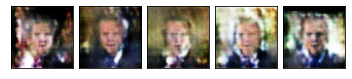

--- EPOCH 88/100 ---
100%|██████████| 10/10 [00:01<00:00,  5.96it/s]
Discriminator loss: 0.3342110842466354
Generator loss:     4.032154393196106
Saved checkpoint.


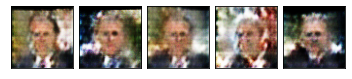

--- EPOCH 89/100 ---
100%|██████████| 10/10 [00:01<00:00,  5.82it/s]
Discriminator loss: 0.2988116905093193
Generator loss:     4.183236169815063
Saved checkpoint.


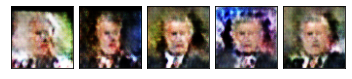

--- EPOCH 90/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.14it/s]
Discriminator loss: 0.32748941481113436
Generator loss:     4.061292099952698
Saved checkpoint.


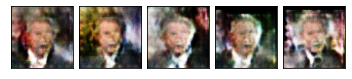

--- EPOCH 91/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.10it/s]
Discriminator loss: 0.31828391253948213
Generator loss:     4.112231278419495
Saved checkpoint.


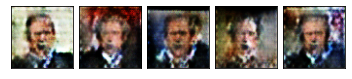

--- EPOCH 92/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.10it/s]
Discriminator loss: 0.3177692234516144
Generator loss:     4.322106599807739
Saved checkpoint.


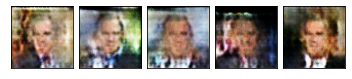

--- EPOCH 93/100 ---
100%|██████████| 10/10 [00:01<00:00,  5.88it/s]
Discriminator loss: 0.9631123393774033
Generator loss:     5.101316106319428
Saved checkpoint.


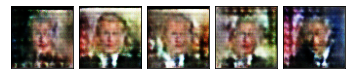

--- EPOCH 94/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.13it/s]
Discriminator loss: 0.6360201507806778
Generator loss:     4.594585514068603
Saved checkpoint.


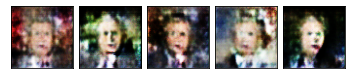

--- EPOCH 95/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.15it/s]
Discriminator loss: 0.5481008052825928
Generator loss:     3.975769507884979
Saved checkpoint.


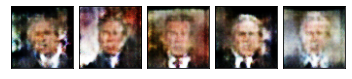

--- EPOCH 96/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.15it/s]
Discriminator loss: 0.3409284070134163
Generator loss:     3.652576279640198
Saved checkpoint.


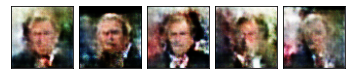

--- EPOCH 97/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.09it/s]
Discriminator loss: 0.34475072622299197
Generator loss:     3.7062169790267943
Saved checkpoint.


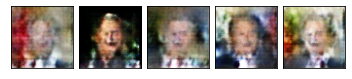

--- EPOCH 98/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.19it/s]
Discriminator loss: 0.2855323955416679
Generator loss:     3.4861965417861938
Saved checkpoint.


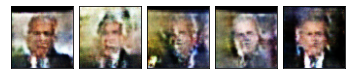

--- EPOCH 99/100 ---
100%|██████████| 10/10 [00:01<00:00,  5.99it/s]
Discriminator loss: 0.3013939306139946
Generator loss:     3.926412081718445
Saved checkpoint.


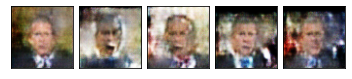

--- EPOCH 100/100 ---
100%|██████████| 10/10 [00:01<00:00,  6.15it/s]
Discriminator loss: 0.2748183190822601
Generator loss:     3.8085874557495116
Saved checkpoint.


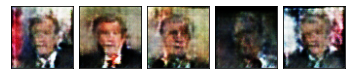

In [7]:
SNGANTrainer(hp).train()

File /home/ofir.s/.pytorch-datasets/lfw-bush.zip exists, skipping download.
Extracting /home/ofir.s/.pytorch-datasets/lfw-bush.zip...
Extracted 531 to /home/ofir.s/.pytorch-datasets/lfw/George_W_Bush
--- EPOCH 1/100 ---
100%|██████████| 10/10 [00:03<00:00,  3.31it/s]
Discriminator loss: -0.26177838742733
Generator loss:     0.633389538526535
Saved checkpoint.


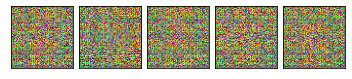

--- EPOCH 2/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.68it/s]
Discriminator loss: -0.35200744271278384
Generator loss:     0.6777444958686829
Saved checkpoint.


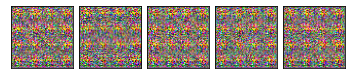

--- EPOCH 3/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.64it/s]
Discriminator loss: -0.374668750166893
Generator loss:     0.6896167278289795
Saved checkpoint.


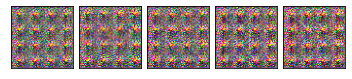

--- EPOCH 4/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.75it/s]
Discriminator loss: -0.3838868260383606
Generator loss:     0.6940464377403259
Saved checkpoint.


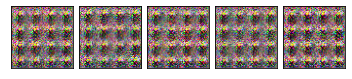

--- EPOCH 5/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.68it/s]
Discriminator loss: -0.390031298995018
Generator loss:     0.6967637300491333
Saved checkpoint.


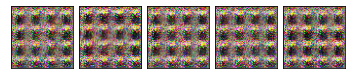

--- EPOCH 6/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.64it/s]
Discriminator loss: -0.3934986352920532
Generator loss:     0.6984550535678864
Saved checkpoint.


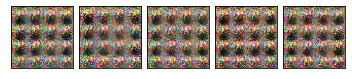

--- EPOCH 7/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.64it/s]
Discriminator loss: -0.39625599086284635
Generator loss:     0.6995364427566528
Saved checkpoint.


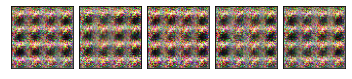

--- EPOCH 8/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.74it/s]
Discriminator loss: -0.3974472999572754
Generator loss:     0.7002304852008819
Saved checkpoint.


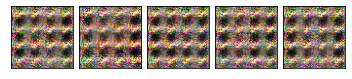

--- EPOCH 9/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.66it/s]
Discriminator loss: -0.39829122722148896
Generator loss:     0.700422203540802
Saved checkpoint.


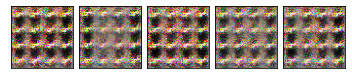

--- EPOCH 10/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.64it/s]
Discriminator loss: -0.3992844969034195
Generator loss:     0.7010503232479095
Saved checkpoint.


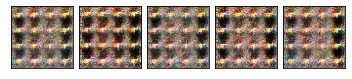

--- EPOCH 11/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.68it/s]
Discriminator loss: -0.3996732860803604
Generator loss:     0.7011675953865051
Saved checkpoint.


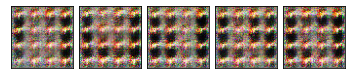

--- EPOCH 12/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.68it/s]
Discriminator loss: -0.40058223307132723
Generator loss:     0.7015033781528472
Saved checkpoint.


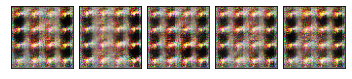

--- EPOCH 13/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.67it/s]
Discriminator loss: -0.4006780594587326
Generator loss:     0.7016623318195343
Saved checkpoint.


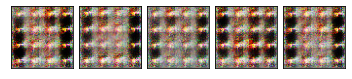

--- EPOCH 14/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.67it/s]
Discriminator loss: -0.40109601318836213
Generator loss:     0.7019333362579345
Saved checkpoint.


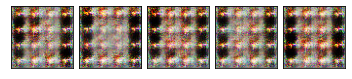

--- EPOCH 15/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.70it/s]
Discriminator loss: -0.4014722615480423
Generator loss:     0.701971048116684
Saved checkpoint.


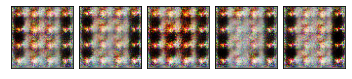

--- EPOCH 16/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.71it/s]
Discriminator loss: -0.40083001255989076
Generator loss:     0.7017564117908478
Saved checkpoint.


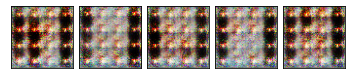

--- EPOCH 17/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.67it/s]
Discriminator loss: -0.4015840023756027
Generator loss:     0.7020734906196594
Saved checkpoint.


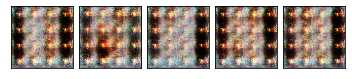

--- EPOCH 18/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.70it/s]
Discriminator loss: -0.4012257754802704
Generator loss:     0.7016558349132538
Saved checkpoint.


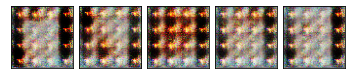

--- EPOCH 19/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.70it/s]
Discriminator loss: -0.4012273281812668
Generator loss:     0.7020569205284118
Saved checkpoint.


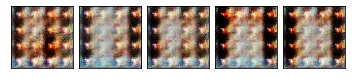

--- EPOCH 20/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.71it/s]
Discriminator loss: -0.40075222253799436
Generator loss:     0.7017215073108674
Saved checkpoint.


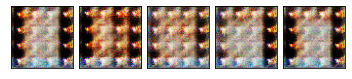

--- EPOCH 21/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.71it/s]
Discriminator loss: -0.4009635657072067
Generator loss:     0.7018046319484711
Saved checkpoint.


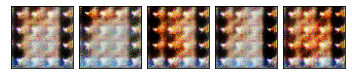

--- EPOCH 22/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.58it/s]
Discriminator loss: -0.3995905160903931
Generator loss:     0.700873202085495
Saved checkpoint.


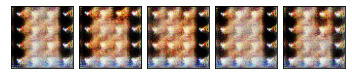

--- EPOCH 23/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.63it/s]
Discriminator loss: -0.4004719316959381
Generator loss:     0.7016832828521729
Saved checkpoint.


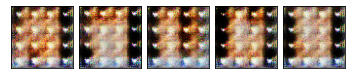

--- EPOCH 24/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.68it/s]
Discriminator loss: -0.39914512634277344
Generator loss:     0.7011613547801971
Saved checkpoint.


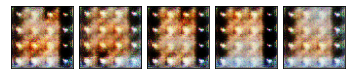

--- EPOCH 25/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.64it/s]
Discriminator loss: -0.3910873711109161
Generator loss:     0.6976801872253418
Saved checkpoint.


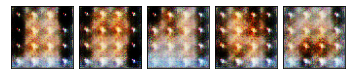

--- EPOCH 26/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.63it/s]
Discriminator loss: -0.3977779299020767
Generator loss:     0.7002961277961731
Saved checkpoint.


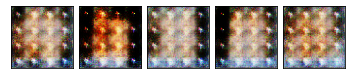

--- EPOCH 27/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.62it/s]
Discriminator loss: -0.3970981538295746
Generator loss:     0.699914962053299
Saved checkpoint.


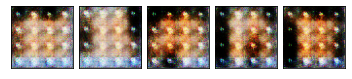

--- EPOCH 28/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.67it/s]
Discriminator loss: -0.3970555901527405
Generator loss:     0.6985957980155945
Saved checkpoint.


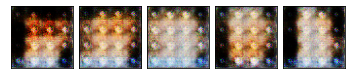

--- EPOCH 29/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.43it/s]
Discriminator loss: -0.3768250048160553
Generator loss:     0.6960302650928497
Saved checkpoint.


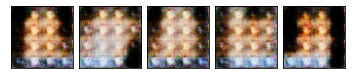

--- EPOCH 30/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.58it/s]
Discriminator loss: -0.392492339015007
Generator loss:     0.6981135368347168
Saved checkpoint.


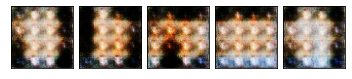

--- EPOCH 31/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.67it/s]
Discriminator loss: -0.39254050254821776
Generator loss:     0.6979739785194397
Saved checkpoint.


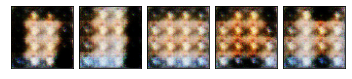

--- EPOCH 32/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.64it/s]
Discriminator loss: -0.3845555990934372
Generator loss:     0.688359797000885
Saved checkpoint.


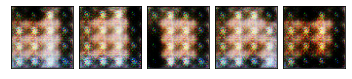

--- EPOCH 33/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.67it/s]
Discriminator loss: -0.40349977016448973
Generator loss:     0.7029103219509125
Saved checkpoint.


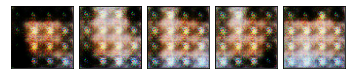

--- EPOCH 34/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.59it/s]
Discriminator loss: -0.40410184264183047
Generator loss:     0.7030821800231933
Saved checkpoint.


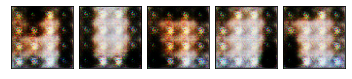

--- EPOCH 35/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.59it/s]
Discriminator loss: -0.4039931774139404
Generator loss:     0.7031641840934754
Saved checkpoint.


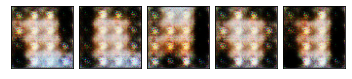

--- EPOCH 36/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.64it/s]
Discriminator loss: -0.382695072889328
Generator loss:     0.6944827973842621
Saved checkpoint.


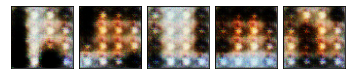

--- EPOCH 37/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.63it/s]
Discriminator loss: -0.38575783371925354
Generator loss:     0.6945056617259979
Saved checkpoint.


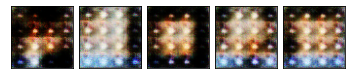

--- EPOCH 38/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.67it/s]
Discriminator loss: -0.39026478826999667
Generator loss:     0.6970757722854615
Saved checkpoint.


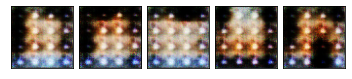

--- EPOCH 39/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.66it/s]
Discriminator loss: -0.39059390127658844
Generator loss:     0.6970966994762421
Saved checkpoint.


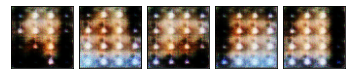

--- EPOCH 40/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.64it/s]
Discriminator loss: -0.3922200441360474
Generator loss:     0.6976476311683655
Saved checkpoint.


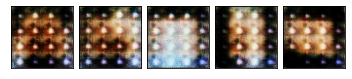

--- EPOCH 41/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.61it/s]
Discriminator loss: -0.36171242892742156
Generator loss:     0.696549654006958
Saved checkpoint.


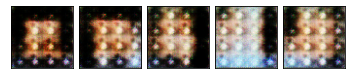

--- EPOCH 42/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.59it/s]
Discriminator loss: -0.3802802383899689
Generator loss:     0.684438043832779
Saved checkpoint.


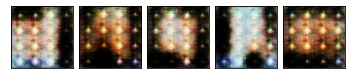

--- EPOCH 43/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.62it/s]
Discriminator loss: -0.3946678340435028
Generator loss:     0.6989918410778045
Saved checkpoint.


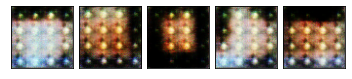

--- EPOCH 44/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.58it/s]
Discriminator loss: -0.3926348119974136
Generator loss:     0.6976081252098083
Saved checkpoint.


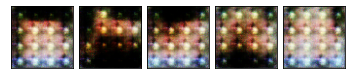

--- EPOCH 45/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.63it/s]
Discriminator loss: -0.3918759018182755
Generator loss:     0.697926938533783
Saved checkpoint.


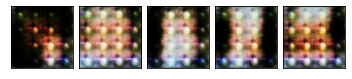

--- EPOCH 46/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.60it/s]
Discriminator loss: -0.39427847862243653
Generator loss:     0.6968889474868775
Saved checkpoint.


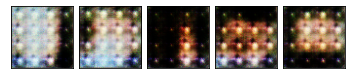

--- EPOCH 47/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.62it/s]
Discriminator loss: -0.3920642673969269
Generator loss:     0.6976684212684632
Saved checkpoint.


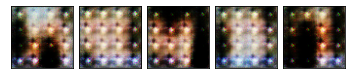

--- EPOCH 48/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.63it/s]
Discriminator loss: -0.3947241246700287
Generator loss:     0.6974589824676514
Saved checkpoint.


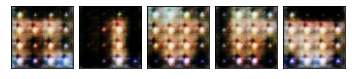

--- EPOCH 49/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.59it/s]
Discriminator loss: -0.3935746312141418
Generator loss:     0.698120754957199
Saved checkpoint.


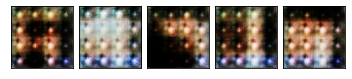

--- EPOCH 50/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.62it/s]
Discriminator loss: -0.39499678313732145
Generator loss:     0.697655975818634
Saved checkpoint.


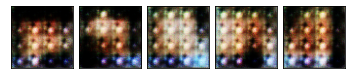

--- EPOCH 51/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.64it/s]
Discriminator loss: -0.3923216462135315
Generator loss:     0.6968690276145935
Saved checkpoint.


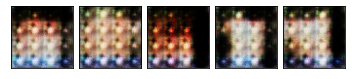

--- EPOCH 52/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.34it/s]
Discriminator loss: -0.39222790002822877
Generator loss:     0.6928552985191345
Saved checkpoint.


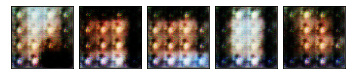

--- EPOCH 53/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.60it/s]
Discriminator loss: -0.40364438891410825
Generator loss:     0.7030329167842865
Saved checkpoint.


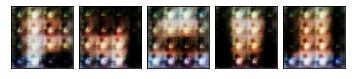

--- EPOCH 54/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.65it/s]
Discriminator loss: -0.4036677718162537
Generator loss:     0.7029182314872742
Saved checkpoint.


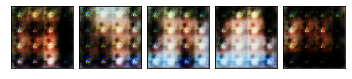

--- EPOCH 55/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.59it/s]
Discriminator loss: -0.40204363167285917
Generator loss:     0.7022759199142456
Saved checkpoint.


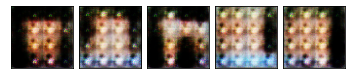

--- EPOCH 56/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.60it/s]
Discriminator loss: -0.3559193968772888
Generator loss:     0.6877779245376587
Saved checkpoint.


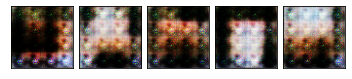

--- EPOCH 57/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.61it/s]
Discriminator loss: -0.40000748336315156
Generator loss:     0.7011926829814911
Saved checkpoint.


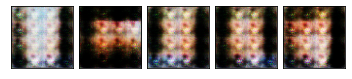

--- EPOCH 58/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.64it/s]
Discriminator loss: -0.39674646556377413
Generator loss:     0.700012868642807
Saved checkpoint.


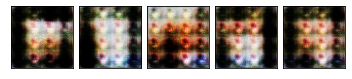

--- EPOCH 59/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.64it/s]
Discriminator loss: -0.391757071018219
Generator loss:     0.6976220786571503
Saved checkpoint.


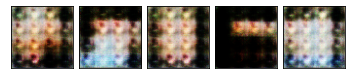

--- EPOCH 60/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.62it/s]
Discriminator loss: -0.3946148306131363
Generator loss:     0.6983327329158783
Saved checkpoint.


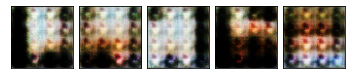

--- EPOCH 61/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.66it/s]
Discriminator loss: -0.3617876648902893
Generator loss:     0.6943167388439179
Saved checkpoint.


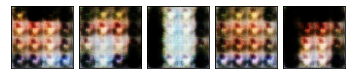

--- EPOCH 62/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.60it/s]
Discriminator loss: -0.3949165105819702
Generator loss:     0.6990455269813538
Saved checkpoint.


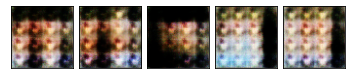

--- EPOCH 63/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.49it/s]
Discriminator loss: -0.3945023834705353
Generator loss:     0.698407244682312
Saved checkpoint.


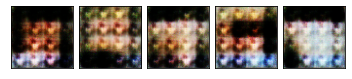

--- EPOCH 64/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.51it/s]
Discriminator loss: -0.3943622916936874
Generator loss:     0.6987447381019593
Saved checkpoint.


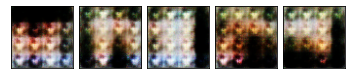

--- EPOCH 65/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.46it/s]
Discriminator loss: -0.3937356501817703
Generator loss:     0.6978950142860413
Saved checkpoint.


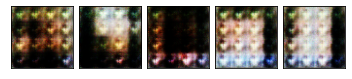

--- EPOCH 66/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.59it/s]
Discriminator loss: -0.3855529725551605
Generator loss:     0.6960054814815522
Saved checkpoint.


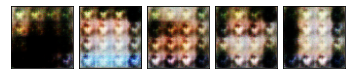

--- EPOCH 67/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.49it/s]
Discriminator loss: -0.3964230418205261
Generator loss:     0.6996567368507385
Saved checkpoint.


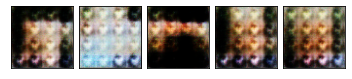

--- EPOCH 68/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.56it/s]
Discriminator loss: -0.39596003890037534
Generator loss:     0.6994850754737854
Saved checkpoint.


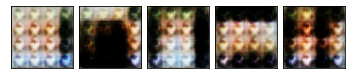

--- EPOCH 69/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.63it/s]
Discriminator loss: -0.3959077179431915
Generator loss:     0.6941539764404296
Saved checkpoint.


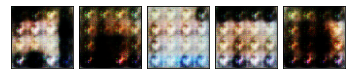

--- EPOCH 70/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.57it/s]
Discriminator loss: -0.4039520174264908
Generator loss:     0.7031160891056061
Saved checkpoint.


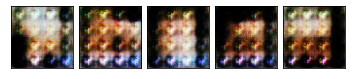

--- EPOCH 71/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.64it/s]
Discriminator loss: -0.40237886607646944
Generator loss:     0.7022865653038025
Saved checkpoint.


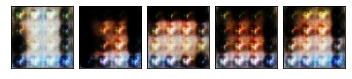

--- EPOCH 72/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.64it/s]
Discriminator loss: -0.40003205835819244
Generator loss:     0.6992336273193359
Saved checkpoint.


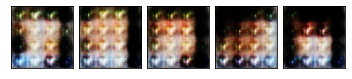

--- EPOCH 73/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.59it/s]
Discriminator loss: -0.3759482204914093
Generator loss:     0.6904502630233764
Saved checkpoint.


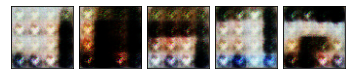

--- EPOCH 74/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.62it/s]
Discriminator loss: -0.40296354591846467
Generator loss:     0.702778023481369
Saved checkpoint.


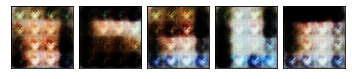

--- EPOCH 75/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.58it/s]
Discriminator loss: -0.4042337119579315
Generator loss:     0.7032138586044312
Saved checkpoint.


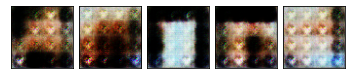

--- EPOCH 76/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.61it/s]
Discriminator loss: -0.4043949365615845
Generator loss:     0.7032289505004883
Saved checkpoint.


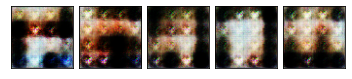

--- EPOCH 77/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.61it/s]
Discriminator loss: -0.4036948412656784
Generator loss:     0.7029222846031189
Saved checkpoint.


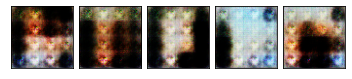

--- EPOCH 78/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.65it/s]
Discriminator loss: -0.36882027983665466
Generator loss:     0.6905471384525299
Saved checkpoint.


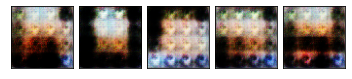

--- EPOCH 79/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.63it/s]
Discriminator loss: -0.3949406385421753
Generator loss:     0.6989361584186554
Saved checkpoint.


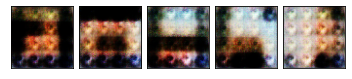

--- EPOCH 80/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.57it/s]
Discriminator loss: -0.39529616236686704
Generator loss:     0.6995022535324097
Saved checkpoint.


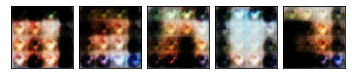

--- EPOCH 81/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.56it/s]
Discriminator loss: -0.39536515176296233
Generator loss:     0.6990336060523987
Saved checkpoint.


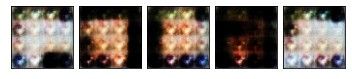

--- EPOCH 82/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.63it/s]
Discriminator loss: -0.3968210220336914
Generator loss:     0.6990558862686157
Saved checkpoint.


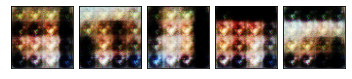

--- EPOCH 83/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.61it/s]
Discriminator loss: -0.4040739893913269
Generator loss:     0.7032041609287262
Saved checkpoint.


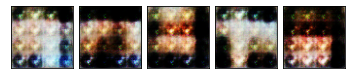

--- EPOCH 84/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.64it/s]
Discriminator loss: -0.3730075418949127
Generator loss:     0.6987510621547699
Saved checkpoint.


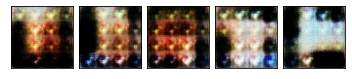

--- EPOCH 85/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.56it/s]
Discriminator loss: -0.39287211298942565
Generator loss:     0.6976331412792206
Saved checkpoint.


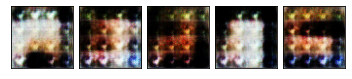

--- EPOCH 86/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.62it/s]
Discriminator loss: -0.3955027312040329
Generator loss:     0.6990972220897674
Saved checkpoint.


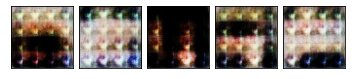

--- EPOCH 87/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.63it/s]
Discriminator loss: -0.39577576816082
Generator loss:     0.6995152175426483
Saved checkpoint.


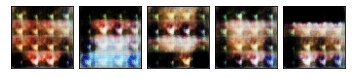

--- EPOCH 88/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.63it/s]
Discriminator loss: -0.3962945371866226
Generator loss:     0.6991918087005615
Saved checkpoint.


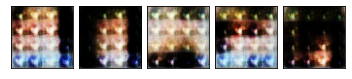

--- EPOCH 89/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.59it/s]
Discriminator loss: -0.39214907586574554
Generator loss:     0.6986520648002624
Saved checkpoint.


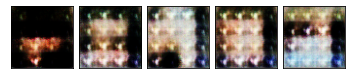

--- EPOCH 90/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.64it/s]
Discriminator loss: -0.3925474852323532
Generator loss:     0.6984909057617188
Saved checkpoint.


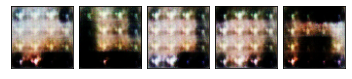

--- EPOCH 91/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.64it/s]
Discriminator loss: -0.3950108170509338
Generator loss:     0.6986395597457886
Saved checkpoint.


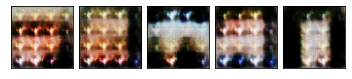

--- EPOCH 92/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.64it/s]
Discriminator loss: -0.39571449160575867
Generator loss:     0.6987767398357392
Saved checkpoint.


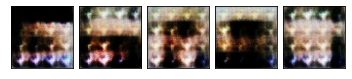

--- EPOCH 93/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.62it/s]
Discriminator loss: -0.354519447684288
Generator loss:     0.6791467428207397
Saved checkpoint.


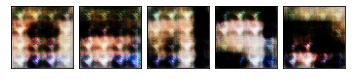

--- EPOCH 94/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.63it/s]
Discriminator loss: -0.40120813250541687
Generator loss:     0.7016499876976013
Saved checkpoint.


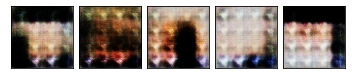

--- EPOCH 95/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.64it/s]
Discriminator loss: -0.3999260663986206
Generator loss:     0.701173621416092
Saved checkpoint.


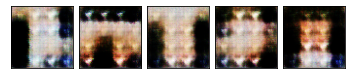

--- EPOCH 96/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.60it/s]
Discriminator loss: -0.3956402987241745
Generator loss:     0.6985870480537415
Saved checkpoint.


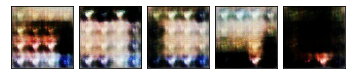

--- EPOCH 97/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.66it/s]
Discriminator loss: -0.39575214982032775
Generator loss:     0.6982944428920745
Saved checkpoint.


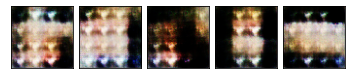

--- EPOCH 98/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.65it/s]
Discriminator loss: -0.399378702044487
Generator loss:     0.6984759092330932
Saved checkpoint.


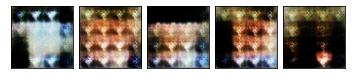

--- EPOCH 99/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.63it/s]
Discriminator loss: -0.4042296171188354
Generator loss:     0.703273868560791
Saved checkpoint.


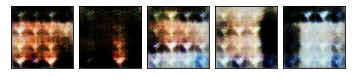

--- EPOCH 100/100 ---
100%|██████████| 10/10 [00:02<00:00,  3.65it/s]
Discriminator loss: -0.4040560871362686
Generator loss:     0.7030413985252381
Saved checkpoint.


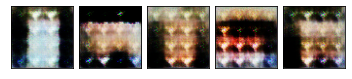

In [11]:
WGANTrainer(hp).train()